In [1]:
import os
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import cv2
from glob import glob
from sklearn.model_selection import train_test_split
from tqdm import tqdm_notebook as tqdm
from plotly.offline import iplot
import plotly as py
import plotly.tools as tls
import cufflinks as cf
from IPython.core.display import display, HTML
from pathlib import Path

import tensorflow as tf
from tensorflow.keras.utils import CustomObjectScope
from tqdm import tqdm
import keras
import imgaug.augmenters as iaa
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras import backend as K

from keras.losses import binary_crossentropy
import tensorflow as tf

from tensorflow.keras.optimizers import Adam
from datetime import datetime 
from PIL import Image
import albumentations as A



In [2]:

AUTOTUNE = tf.data.experimental.AUTOTUNE
plt.style.use('fivethirtyeight')
py.offline.init_notebook_mode(connected = True)
cf.go_offline()
%matplotlib inline

In [3]:
# Setting random seeds
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
random.seed(hash("setting random seeds") % 2**32 - 1)
np.random.seed(hash("improves reproducibility") % 2**32 - 1)
tf.random.set_seed(hash("by removing stochasticity") % 2**32 - 1)

# Data Analysis and Preprocessing

In [4]:
train_img = "../input/sartorius-cell-instance-segmentation/train"
train_csv = "../input/sartorius-cell-instance-segmentation/train.csv"

df = pd.read_csv(train_csv)
df.head()

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


In [5]:
len(np.unique(df["id"])) #number of unique ids

606

In [6]:
len(df["id"]) #total no of records present

73585

In [7]:
df["cell_type"].value_counts().iplot(kind='bar',color='blue') #different types of cells in the dataset

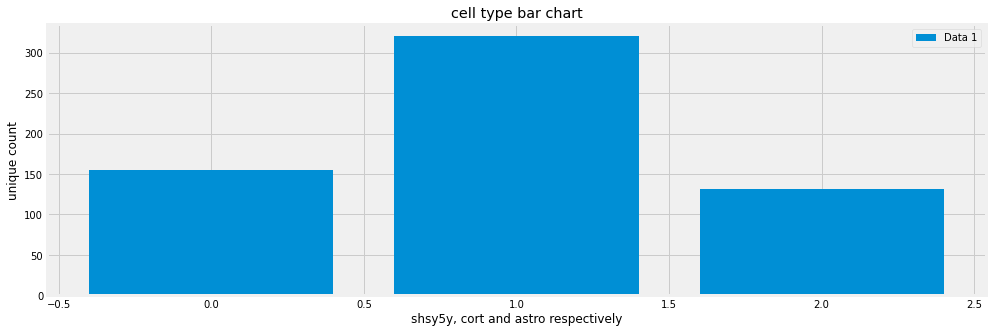

In [8]:
plt.figure(figsize=(15,5))
plt.bar([0,1,2],[len(np.unique(df[df['cell_type']=='shsy5y']['id'])),len(np.unique(df[df['cell_type']=='cort']['id'])),len(np.unique(df[df['cell_type']=='astro']['id']))], label="Data 1")
plt.legend()

plt.xlabel('shsy5y, cort and astro respectively')
plt.ylabel('unique count')
plt.title('cell type bar chart')

plt.show()

> It shows the count of the cell types are `cort>shsy5y>astro`

In [9]:
def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
    for lo, hi in zip(starts, ends):
        img[lo : hi] = color
    return img.reshape(shape)
    



def build_masks(image_id,input_shape, colors=True):
    height, width = input_shape
    labels = df[df["id"] == image_id]["annotation"].tolist()
    if colors:
        mask = np.zeros((height, width, 3))
        for label in labels:
            mask += rle_decode(label, shape=(height,width , 3), color=np.random.rand(3))
    else:
        mask = np.zeros((height, width, 1))
        for label in labels:
            mask += rle_decode(label, shape=(height, width, 1))
    mask = mask.clip(0, 1)
    return mask
    

In [10]:
ide = 'ffdb3cc02eef'
sample_image_df = df[df['id'] == ide]
sample_path = f"../input/sartorius-cell-instance-segmentation/train/{sample_image_df['id'].iloc[0]}.png"
sample_img = cv2.imread(sample_path)
print(sample_img.shape)
sample_masks1=build_masks(ide,input_shape=(520, 704), colors=False)
sample_masks1.shape

(520, 704, 3)


(520, 704, 1)

Text(0.5, 1.0, 'astro color mask iamge')

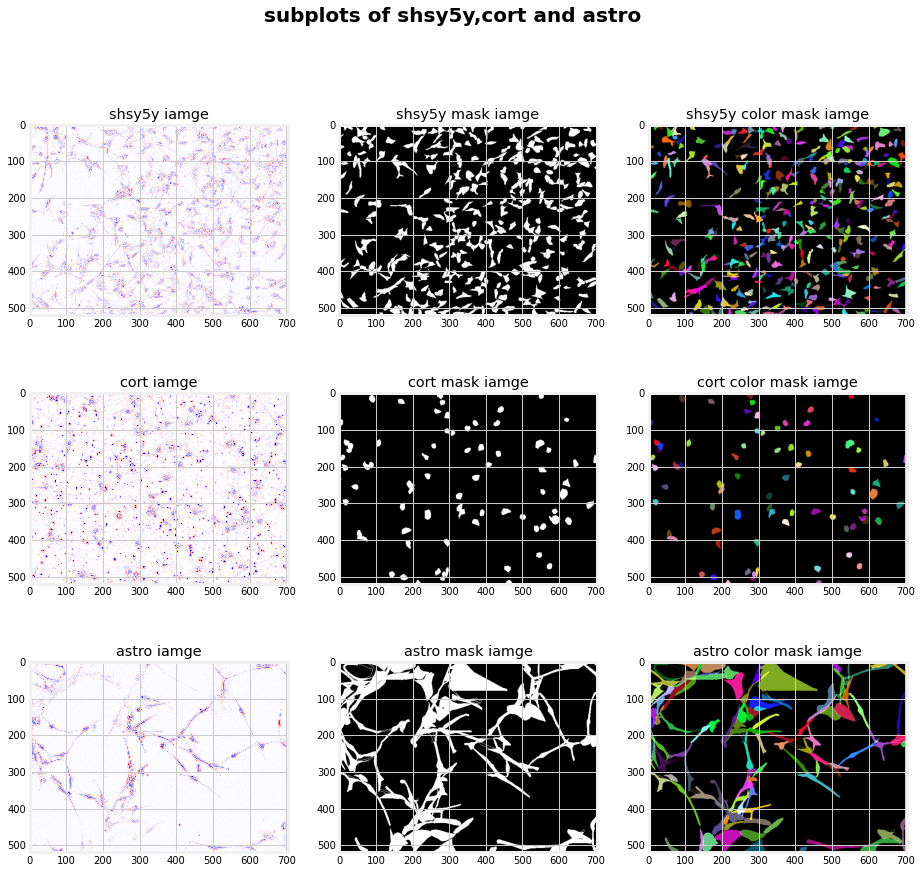

In [11]:
ids = ['fe3e30f849f4','ffdb3cc02eef','0140b3c8f445']
COLOR_MAP = 'seismic'


def load_data_viz(ids):
    loaded_data = []
    for ide in ids:
        sample_image_df = df[df['id'] == ide]
        sample_path = f"../input/sartorius-cell-instance-segmentation/train/{sample_image_df['id'].iloc[0]}.png"
        sample_img = plt.imread(sample_path)
        sample_masks1=build_masks(ide,input_shape=(520, 704), colors=False)
        sample_masks2=build_masks(ide,input_shape=(520, 704), colors=True)
        loaded_data.append([sample_img,sample_masks1,sample_masks2])
    return loaded_data

data = load_data_viz(ids)

    
plt.figure(figsize=(14,14))
plt.suptitle("subplots of shsy5y,cort and astro",fontweight="bold", size=20)

plt.subplot(3, 3, 1)
plt.imshow(data[0][0],cmap = 'seismic')
plt.title("shsy5y iamge")


plt.subplot(3, 3, 2)
plt.imshow(data[0][1],cmap='gray')
plt.title("shsy5y mask iamge")

plt.subplot(3, 3, 3)
plt.imshow(data[0][2])
plt.title("shsy5y color mask iamge")



plt.subplot(3, 3, 4)
plt.imshow(data[1][0],cmap = 'seismic')
plt.title("cort iamge")

plt.subplot(3, 3, 5)
plt.imshow(data[1][1],cmap='gray')
plt.title("cort mask iamge")

plt.subplot(3, 3, 6)
plt.imshow(data[1][2])
plt.title("cort color mask iamge")



plt.subplot(3, 3, 7)
plt.imshow(data[2][0],cmap = 'seismic')
plt.title("astro iamge")

plt.subplot(3, 3, 8)
plt.imshow(data[2][1],cmap='gray')
plt.title("astro mask iamge")

plt.subplot(3, 3, 9)
plt.imshow(data[2][2])
plt.title("astro color mask iamge")



> Structure wise `shsy5y` cells look bigger than the `cort` types but smaller than the `astro` types.

In [12]:
ids = ['fe3e30f849f4','ffdb3cc02eef','0140b3c8f445']
COLOR_MAP = 'seismic'


def load_data_viz(ids):
    loaded_data = []
    for ide in ids:
        sample_image_df = df[df['id'] == ide]
        sample_path = f"../input/sartorius-cell-instance-segmentation/train/{sample_image_df['id'].iloc[0]}.png"
        sample_img = cv2.imread(sample_path,cv2.IMREAD_COLOR)
        loaded_data.append(sample_img)
    return loaded_data



aug_data = []
def get_aug(sample_img):
    aug1 = iaa.AllChannelsCLAHE(clip_limit=(1, 10), per_channel=True)(image=sample_img)
    aug2 = iaa.LogContrast(gain=(0.6, 1.4), per_channel=True)(image=sample_img)
    aug3 = iaa.BlendAlpha((0.0, 1.0), iaa.HistogramEqualization())(image=sample_img)
    aug4 = iaa.Canny(alpha=(0.1, 0.8))(image=sample_img)
    aug5 = iaa.Canny(alpha=(0.0, 0.5),colorizer=iaa.RandomColorsBinaryImageColorizer(color_true=255,color_false=0))(image=sample_img)
    aug6 = iaa.Canny(alpha=(0.4, 0.5), sobel_kernel_size=[3, 7])(image=sample_img)
    aug_data.append([aug1,aug2,aug3,aug4,aug5,aug6])
    return aug_data


cell_img = load_data_viz(ids)
aug_img1 =  get_aug(cell_img[0])
aug_img2 =  get_aug(cell_img[1])
aug_img3 =  get_aug(cell_img[2])

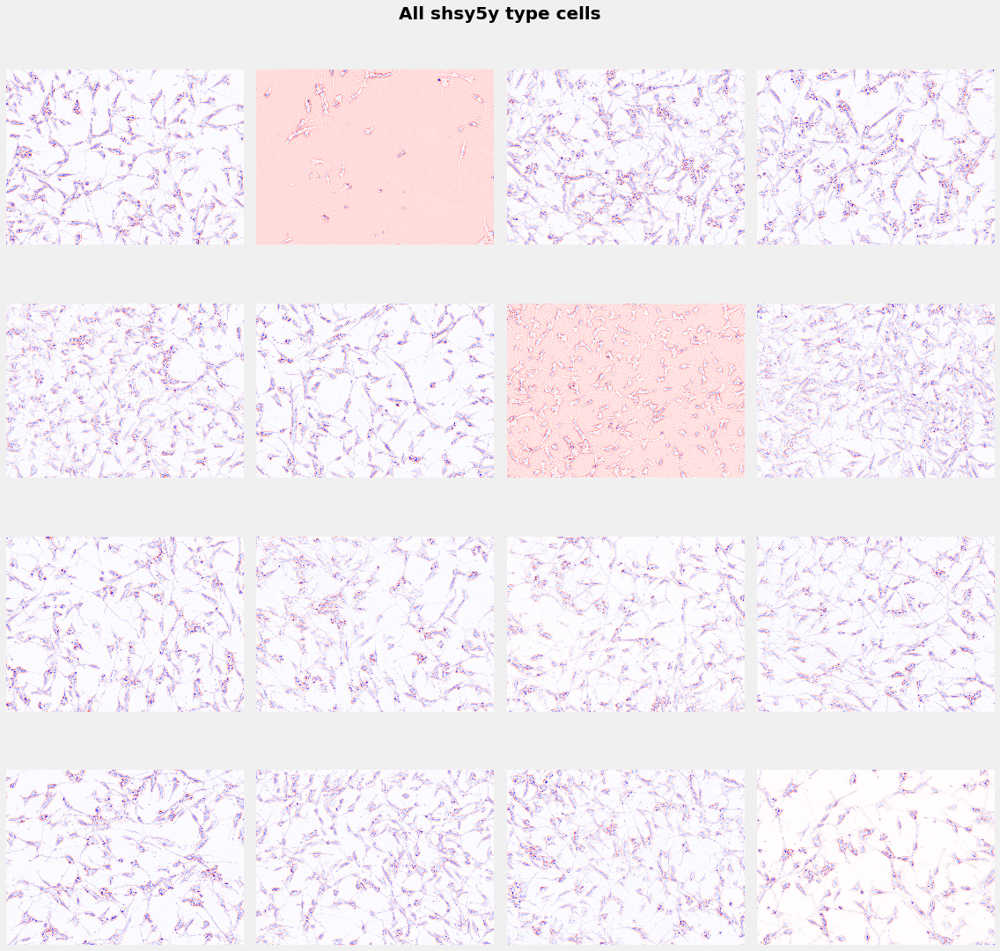

In [13]:
def get_img_paths(cell_type, i,j): 
    ids = np.unique(df[df['cell_type']==cell_type]['id'])[i:j]
    paths = []
    for ide in ids:
        sample_image_df = df[df['id'] == ide]
        sample_path = f"../input/sartorius-cell-instance-segmentation/train/{sample_image_df['id'].iloc[0]}.png"
        paths.append(sample_path)
    return paths


def show_img_subplot(i,j,title_text,cell_type = 'shsy5y'):
    images_paths = get_img_paths(cell_type,i,j)
    plt.style.use('fivethirtyeight')
    figure, ax = plt.subplots(nrows=4,ncols=4,figsize=(16,16) )
    plt.suptitle(title_text,fontweight="bold", size=20)
    for ind,image_path in enumerate(images_paths):
        image=plt.imread(image_path)
        try:
            ax.ravel()[ind].imshow(image,cmap = 'seismic')
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()
    
show_img_subplot(23,39,"All shsy5y type cells",'shsy5y')

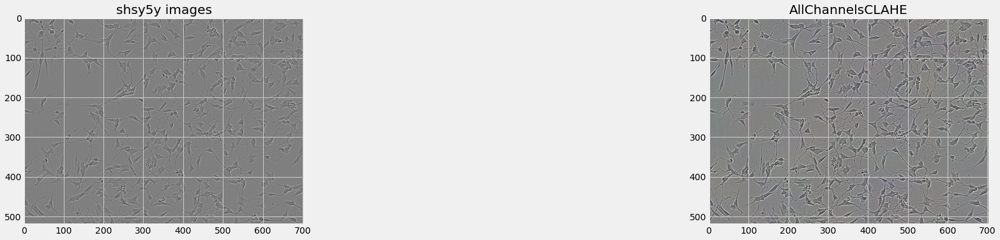

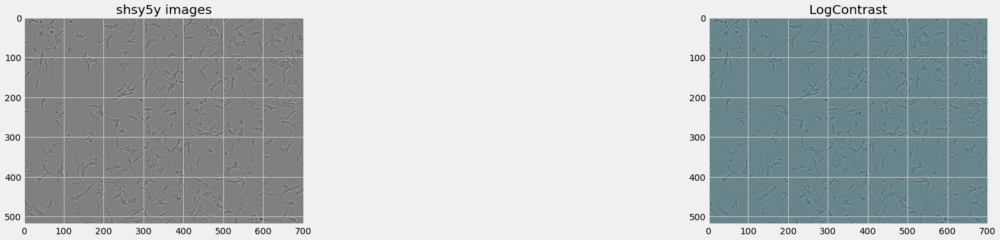

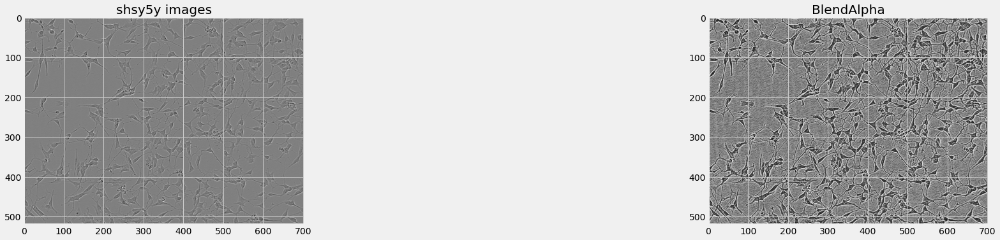

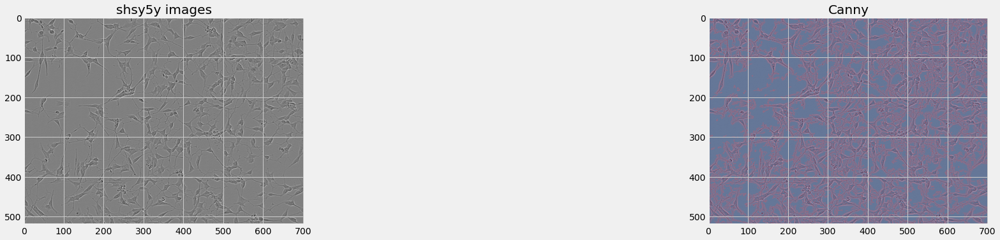

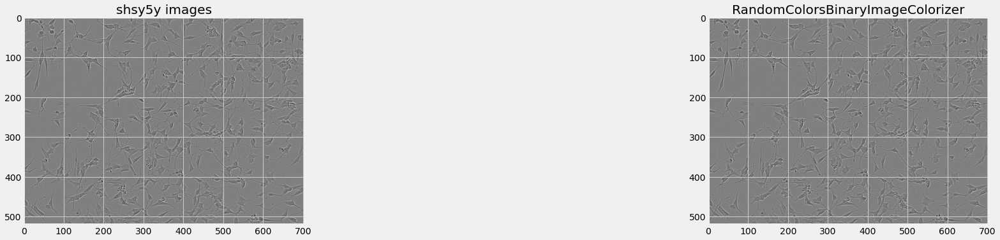

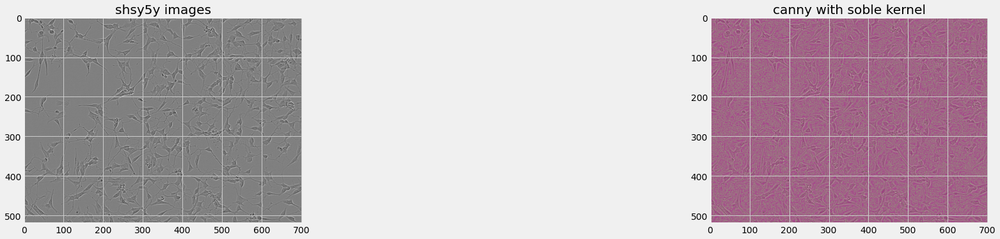

In [14]:
method_names = ["AllChannelsCLAHE","LogContrast","BlendAlpha","Canny","RandomColorsBinaryImageColorizer","canny with soble kernel"]

def plot(data,data_idx = 0,img_idx = 0,text="shsy5y images"):
    display(HTML('<h1 style="background-color: #2dfafa;align="center">Original Image Vs Different types of Augmentations</h1>'))
    for i,j in enumerate(range(1,13,2)):
        plt.figure(figsize=(30,30))
        plt.subplot(6, 2, j)
        plt.title(text)
        plt.imshow(cell_img[img_idx])
        plt.subplot(6, 2, j+1)
        plt.imshow(data[data_idx][i])
        plt.title(method_names[i])
        plt.tight_layout()
        plt.show()


plot(aug_img1,0,0,text = "shsy5y images")

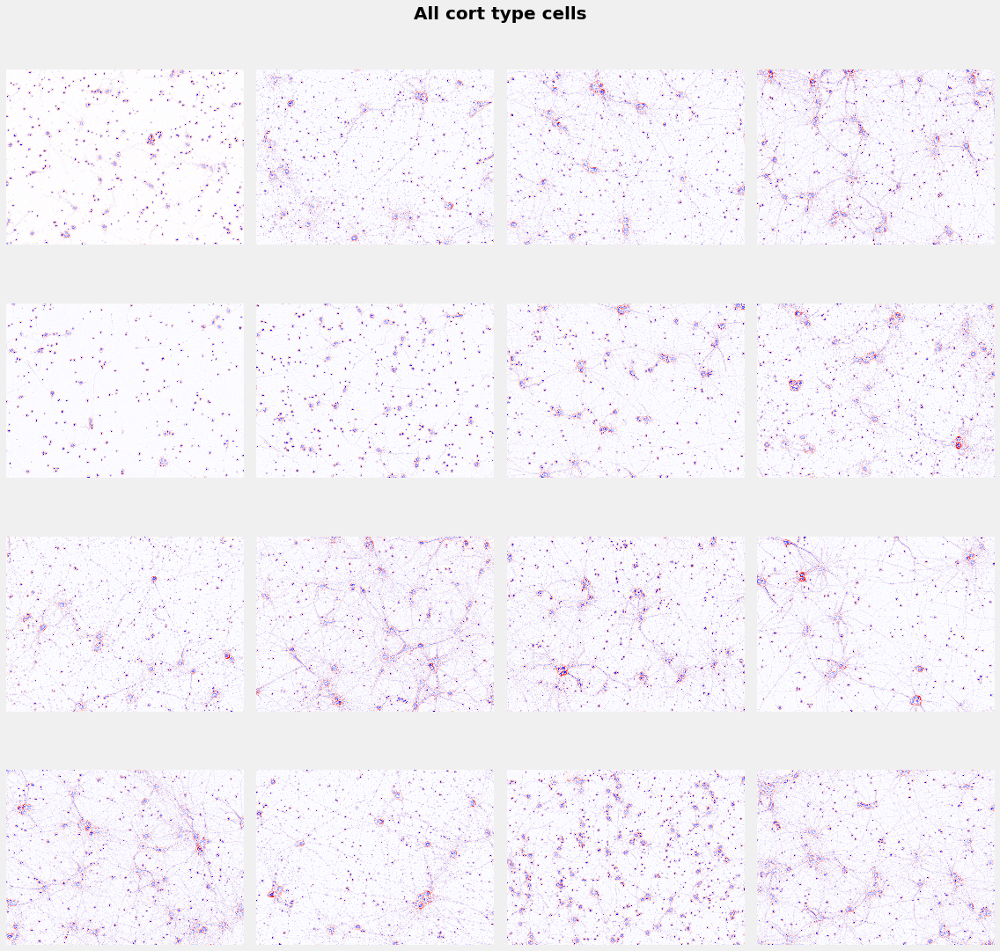

In [15]:
show_img_subplot(23,39,"All cort type cells",'cort')

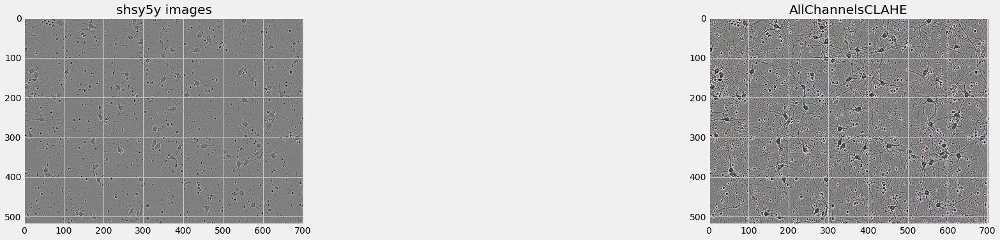

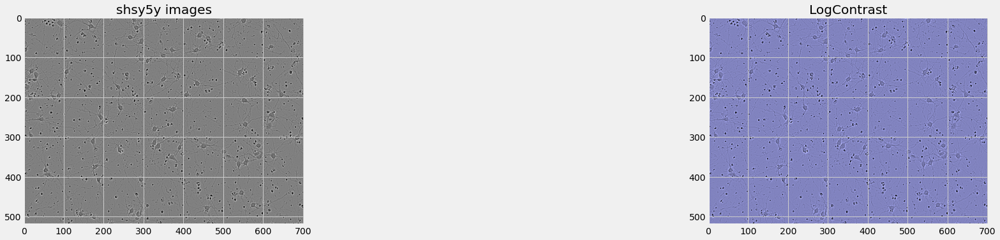

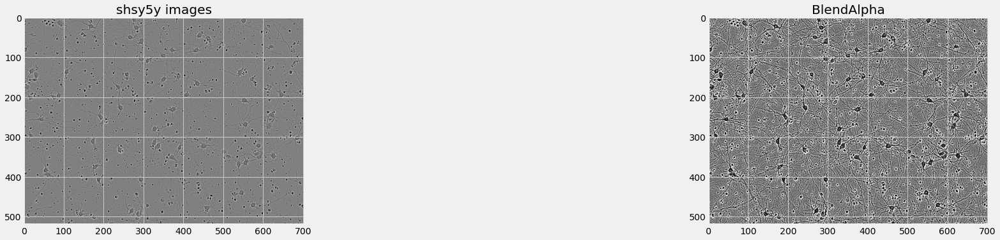

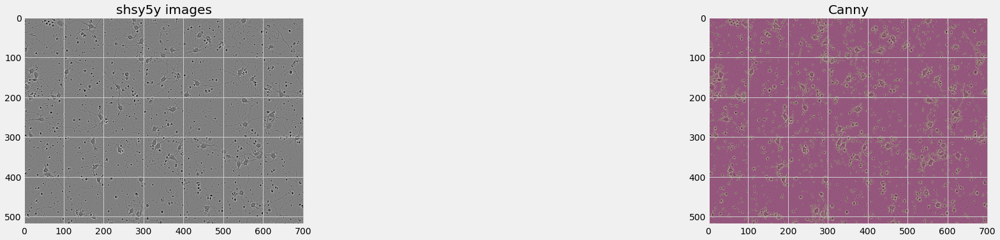

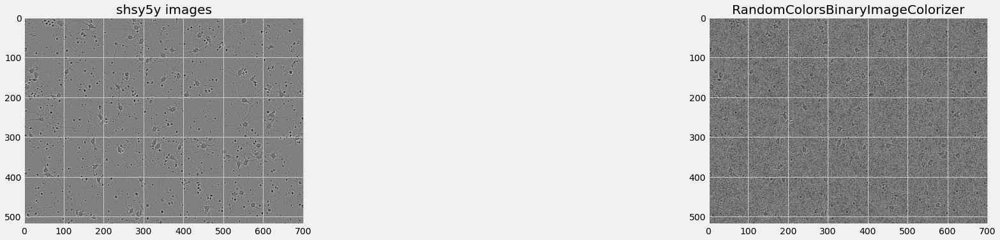

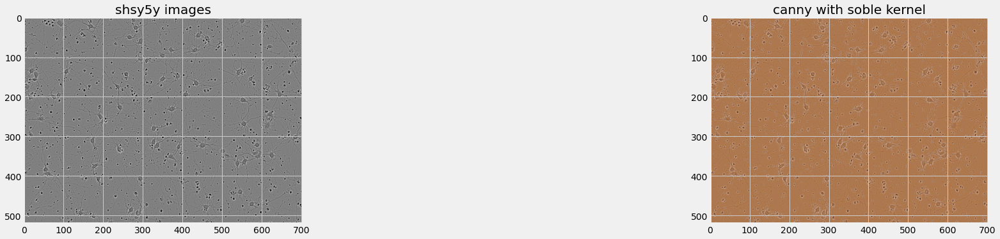

In [16]:
plot(aug_img2,1,1)

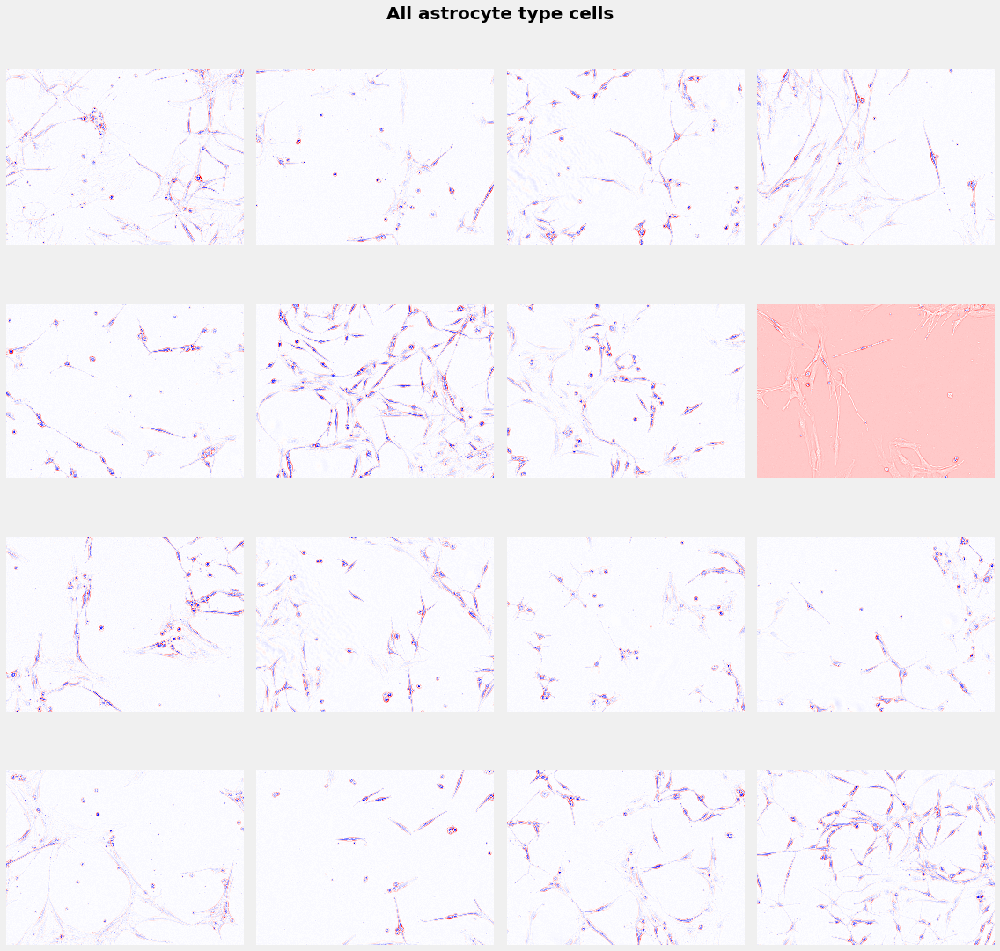

In [17]:
show_img_subplot(23,39,"All astrocyte type cells",'astro')

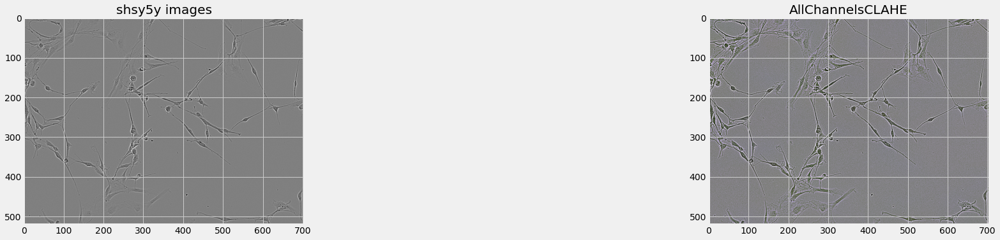

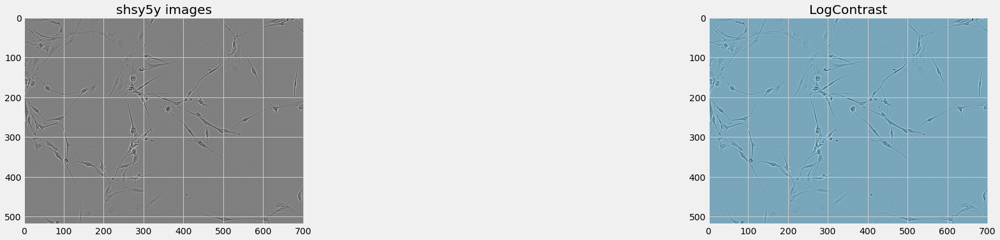

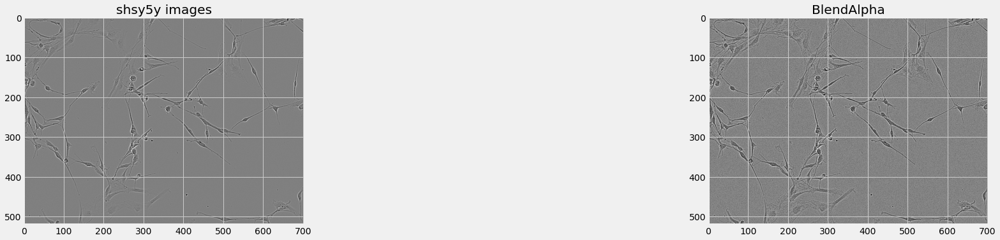

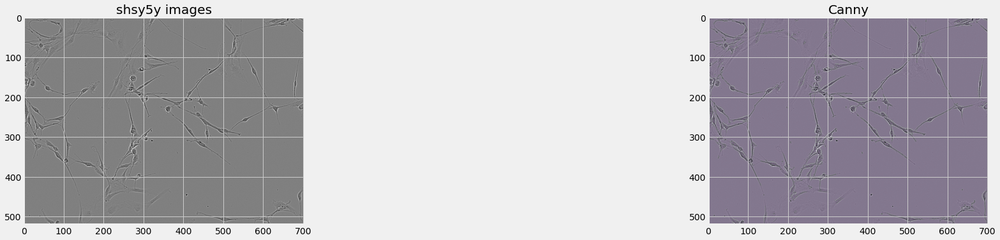

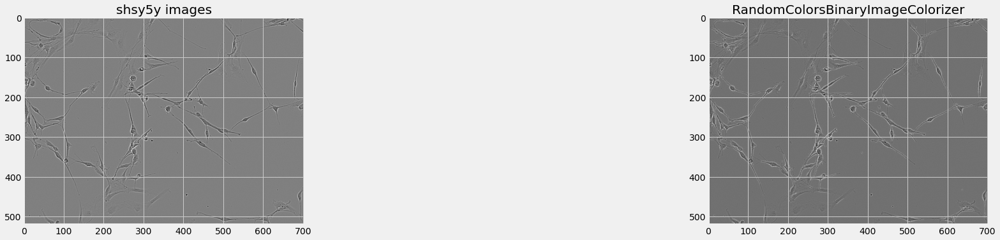

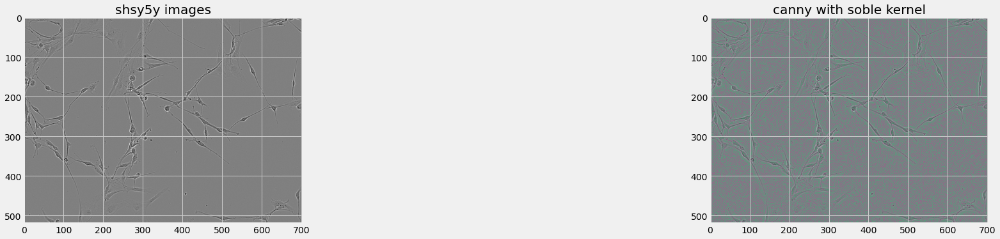

In [18]:
plot(aug_img3,2,2)

Text(0.5, 1.0, 'BlendAlpha')

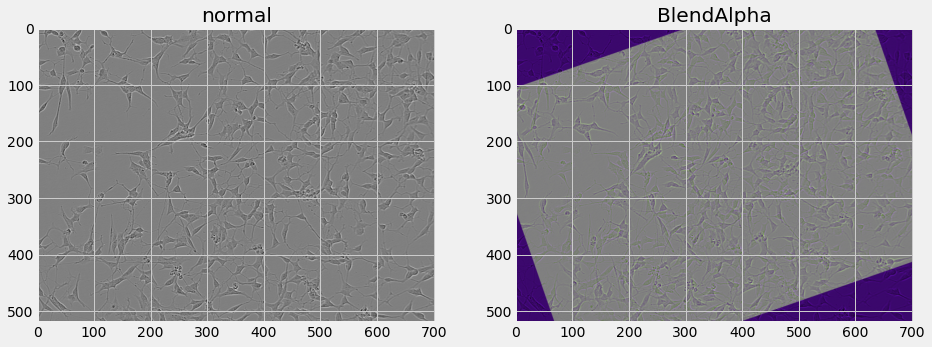

In [19]:
import imgaug.augmenters as iaa
ide = "fe3e30f849f4"
sample_image_df = df[df['id'] == ide]
sample_path = f"../input/sartorius-cell-instance-segmentation/train/{sample_image_df['id'].iloc[0]}.png"
sample_img = cv2.imread(sample_path,cv2.IMREAD_COLOR)
# sample_img = plt.imread(sample_path)
# sample_img = sample_img.astype('float16')
aug = iaa.BlendAlpha(
    (0.0, 1.0),
    iaa.Affine(rotate=(-20, 20)),
    per_channel=0.5)(image=sample_img)

plt.figure(figsize=(14,14))
plt.subplot(1,2,1)
plt.imshow(sample_img,cmap="seismic")
plt.title("normal")
plt.subplot(1,2,2)
plt.imshow(aug,cmap="seismic")
plt.title("BlendAlpha")

## Data pipeline:


In [20]:
def load_data(mask_path, split=0.1):
    img_path = "../input/sartorius-cell-instance-segmentation/train"
    images = [img_path + "/"+ i for i in sorted(os.listdir("../input/sartorious-nb-1-data-preprocessing-visualization/masks/img"))]
    masks = [mask_path + "/"+ i for i in sorted(os.listdir("../input/sartorious-nb-1-data-preprocessing-visualization/masks/img"))]

    train_x, valid_x = train_test_split(images, test_size=split, random_state=42)
    train_y, valid_y = train_test_split(masks, test_size=split, random_state=42)


    return (train_x, train_y), (valid_x, valid_y)

In [21]:
mask_path = "../input/sartorious-nb-1-data-preprocessing-visualization/masks/img"
(train_x, train_y), (valid_x, valid_y) = load_data(mask_path)

In [22]:
train_x = np.array(train_x)
train_y = np.array(train_y)
valid_x = np.array(valid_x)
valid_y = np.array(valid_y)

In [23]:
def load_image_and_label_from_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)    
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    
    return img, mask

In [24]:
training_data = tf.data.Dataset.from_tensor_slices((train_x, train_y))
validation_data = tf.data.Dataset.from_tensor_slices((valid_x, valid_y))

training_data = training_data.map(load_image_and_label_from_path, num_parallel_calls=AUTOTUNE)
validation_data = validation_data.map(load_image_and_label_from_path, num_parallel_calls=AUTOTUNE)


2021-11-30 07:07:02.113792: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-30 07:07:02.115007: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-30 07:07:02.115725: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-30 07:07:02.119988: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [25]:
def augment_train_data(train_ds):
    transforms = A.Compose([
            A.RandomResizedCrop(image_size, image_size),
            A.Transpose(p=0.5),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.ShiftScaleRotate(p=0.5),
            A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
            A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.1), contrast_limit=(-0.1, 0.1), p=0.5),
            A.CoarseDropout(p=0.5),
            A.Cutout(p=0.5),
            ], p=1)
    
    def aug_fn(image,mask):
        aug_data_all = transforms(image=image,mask=mask)
        aug_img = aug_data_all["image"]
        aug_img = tf.cast(aug_img, tf.float32)
        
        aug_mask = aug_data_all["mask"]
        aug_mask = tf.cast(aug_mask, tf.float32)
        return aug_img,aug_mask

    def process_data(image, mask):
        aug_img,aug_mask = tf.numpy_function(func=aug_fn, inp=[image,mask], Tout=[tf.float32,tf.float32])
        return aug_img, aug_mask
    
    def set_shapes(img, mask, img_shape=(image_size,image_size,3)):
        img.set_shape(img_shape)
        mask.set_shape([img_shape[0],img_shape[1],1])
        return img, mask
    
    ds_alb = train_ds.map(partial(process_data), num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
    ds_alb = ds_alb.map(set_shapes, num_parallel_calls=AUTOTUNE)
    ds_alb = ds_alb.repeat()
    ds_alb = ds_alb.batch(batch)
    return ds_alb

In [26]:
def augment_val_data(val_ds):
    transforms = A.Compose([
                A.CenterCrop(image_size, image_size),
                ], p=1)
#     transforms = A.Compose([
#             A.RandomResizedCrop(image_size, image_size),
#             A.Transpose(p=0.5),
#             A.HorizontalFlip(p=0.5),
#             A.VerticalFlip(p=0.5),
#             A.ShiftScaleRotate(p=0.5),
#             A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
#             A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.1), contrast_limit=(-0.1, 0.1), p=0.5),
#             A.CoarseDropout(p=0.5),
#             A.Cutout(p=0.5),
#             ], p=1)
    
    def aug_fn(image,mask):

        aug_data_all = transforms(image=image,mask=mask)
        aug_img = aug_data_all["image"]
        aug_img = tf.cast(aug_img, tf.float32)
        
        aug_mask = aug_data_all["mask"]
        aug_mask = tf.cast(aug_mask, tf.float32)
        return aug_img,aug_mask

    def process_data(image, mask):
        aug_img,aug_mask = tf.numpy_function(func=aug_fn, inp=[image,mask], Tout=[tf.float32,tf.float32])
        return aug_img, aug_mask
    
    def set_shapes(img, mask, img_shape=(image_size,image_size,3)):
        img.set_shape(img_shape)
        mask.set_shape([img_shape[0],img_shape[1],1])
        return img, mask
    
    ds_alb = val_ds.map(partial(process_data), num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
    ds_alb = ds_alb.map(set_shapes, num_parallel_calls=AUTOTUNE).batch(batch)
    return ds_alb

In [27]:
from functools import partial

batch = 4
image_size = 256
input_shape = (image_size, image_size, 3)
train_alb = augment_train_data(training_data)
val_alb = augment_val_data(validation_data)

/opt/conda/lib/python3.7/site-packages/albumentations/augmentations/transforms.py:691: FutureWarning:

This class has been deprecated. Please use CoarseDropout



In [28]:
def conv_block(x, filter_size, size, dropout, batch_norm=False):
    
    conv = layers.Conv2D(size, (filter_size, filter_size), padding="same")(x)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation("relu")(conv)

    conv = layers.Conv2D(size, (filter_size, filter_size), padding="same")(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation("relu")(conv)
    
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)

    return conv


def repeat_elem(tensor, rep):

     return layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3),
                          arguments={'repnum': rep})(tensor)


def res_conv_block(x, filter_size, size, dropout, batch_norm=False):
    

    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(x)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation('relu')(conv)
    
    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    #conv = layers.Activation('relu')(conv)    #Activation before addition with shortcut
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)

    shortcut = layers.Conv2D(size, kernel_size=(1, 1), padding='same')(x)
    if batch_norm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)

    res_path = layers.add([shortcut, conv])
    res_path = layers.Activation('relu')(res_path)    #Activation after addition with shortcut (Original residual block)
    return res_path

def gating_signal(input, out_size, batch_norm=False):
    
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batch_norm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)

# Getting the x signal to the same shape as the gating signal
    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same')(x)  # 16
    shape_theta_x = K.int_shape(theta_x)

# Getting the gating signal to the same number of filters as the inter_shape
    phi_g = layers.Conv2D(inter_shape, (1, 1), padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3),
                                 strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]),
                                 padding='same')(phi_g)  # 16

    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)  # 32

    upsample_psi = repeat_elem(upsample_psi, shape_x[3])

    y = layers.multiply([upsample_psi, x])

    result = layers.Conv2D(shape_x[3], (1, 1), padding='same')(y)
    result_bn = layers.BatchNormalization()(result)
    return result_bn



def Attention_ResUNet(input_shape, NUM_CLASSES=1, dropout_rate=0.0, batch_norm=True):
    '''
    attention  baed Rsidual UNet
    
    '''
    # network structure
    FILTER_NUM = 64 # number of basic filters for the first layer
    FILTER_SIZE = 3 # size of the convolutional filter
    UP_SAMP_SIZE = 2 # size of upsampling filters
    # input data
    # dimension of the image depth
    inputs = layers.Input(input_shape, dtype=tf.float32)
    axis = 3

    # Downsampling layers
    # DownRes 1, double residual convolution + pooling
    conv_128 = res_conv_block(inputs, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)
    pool_64 = layers.MaxPooling2D(pool_size=(2,2))(conv_128)
    # DownRes 2
    conv_64 = res_conv_block(pool_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    pool_32 = layers.MaxPooling2D(pool_size=(2,2))(conv_64)
    # DownRes 3
    conv_32 = res_conv_block(pool_32, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    pool_16 = layers.MaxPooling2D(pool_size=(2,2))(conv_32)
    # DownRes 4
    conv_16 = res_conv_block(pool_16, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    pool_8 = layers.MaxPooling2D(pool_size=(2,2))(conv_16)
    # DownRes 5, convolution only
    conv_8 = res_conv_block(pool_8, FILTER_SIZE, 16*FILTER_NUM, dropout_rate, batch_norm)

    # Upsampling layers
    # UpRes 6, attention gated concatenation + upsampling + double residual convolution
    gating_16 = gating_signal(conv_8, 8*FILTER_NUM, batch_norm)
    att_16 = attention_block(conv_16, gating_16, 8*FILTER_NUM)
    up_16 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(conv_8)
    up_16 = layers.concatenate([up_16, att_16], axis=axis)
    up_conv_16 = res_conv_block(up_16, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 7
    gating_32 = gating_signal(up_conv_16, 4*FILTER_NUM, batch_norm)
    att_32 = attention_block(conv_32, gating_32, 4*FILTER_NUM)
    up_32 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_16)
    up_32 = layers.concatenate([up_32, att_32], axis=axis)
    up_conv_32 = res_conv_block(up_32, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 8
    gating_64 = gating_signal(up_conv_32, 2*FILTER_NUM, batch_norm)
    att_64 = attention_block(conv_64, gating_64, 2*FILTER_NUM)
    up_64 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_32)
    up_64 = layers.concatenate([up_64, att_64], axis=axis)
    up_conv_64 = res_conv_block(up_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 9
    gating_128 = gating_signal(up_conv_64, FILTER_NUM, batch_norm)
    att_128 = attention_block(conv_128, gating_128, FILTER_NUM)
    up_128 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_64)
    up_128 = layers.concatenate([up_128, att_128], axis=axis)
    up_conv_128 = res_conv_block(up_128, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)

    # 1*1 convolutional layers
    
    conv_final = layers.Conv2D(NUM_CLASSES, kernel_size=(1,1))(up_conv_128)
    conv_final = layers.BatchNormalization(axis=axis)(conv_final)
    conv_final = layers.Activation('sigmoid')(conv_final)  #Change to softmax for multichannel

    # Model integration
    model = models.Model(inputs, conv_final, name="AttentionResUNet")
    return model



# Model Training:

In [29]:
def iou(y_true, y_pred):
    def f(y_true, y_pred):
        
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1. - score

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(tf.cast(y_true, tf.float32), y_pred) + 0.5 * dice_loss(tf.cast(y_true, tf.float32), y_pred)

In [30]:
model_output = "./model_unet.h5"
# "save the Keras model or model weights at some frequency"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    model_output,
    save_best_only=True,
    save_weights_only=True,
)

In [31]:
#pip install segmentation-models

In [32]:
!pip install ../input/segmentation-models/segmentation_models-1.0.1-py3-none-any.whl



Processing /kaggle/input/segmentation-models/segmentation_models-1.0.1-py3-none-any.whl
     |████████████████████████████████| 50 kB 1.6 MB/s 


In [33]:
import segmentation_models as sm
IMG_HEIGHT = 256
IMG_WIDTH  = 256
IMG_CHANNELS = 3
num_labels = 1
input_shape = (IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)
batch = 4


train_steps = len(train_x)//batch
valid_steps = len(valid_x)//batch

if len(train_x) % batch != 0:
    train_steps += 1
if len(valid_x) % batch != 0:
    valid_steps += 1
    
att_res_unet_model = Attention_ResUNet(input_shape,dropout_rate=0.3)

opt = tf.keras.optimizers.Adam(1e-4)
metrics = ["acc", iou]
metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]
att_res_unet_model.compile(loss=bce_dice_loss, optimizer=opt, metrics=metrics)


#att_res_unet_model.compile(optimizer=Adam(lr = 1e-4), loss='binary_crossentropy', 
 #              metrics=['accuracy'])

print(att_res_unet_model.summary())

Segmentation Models: using `keras` framework.
Model: "AttentionResUNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 64) 0           batch_normalization[0][0]        
_____________________________________

In [34]:
att_res_unet_history = att_res_unet_model.fit(train_alb, 
                    verbose=1,
                    batch_size = batch,
                    validation_data=val_alb, 
                    steps_per_epoch=train_steps,
                    validation_steps=valid_steps,
                    shuffle=False,
                    epochs=60,
                    callbacks=[model_checkpoint]) 

2021-11-30 07:07:24.167995: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/60


2021-11-30 07:07:31.429046: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


137/137 [==============================] - 54s 292ms/step - loss: 1.0331 - iou_score: 0.2463 - f1-score: 0.3824 - val_loss: 1.6850 - val_iou_score: 0.1231 - val_f1-score: 0.2118
Epoch 2/60
137/137 [==============================] - 37s 268ms/step - loss: 0.9841 - iou_score: 0.3036 - f1-score: 0.4508 - val_loss: 1.0228 - val_iou_score: 0.3133 - val_f1-score: 0.4637
Epoch 3/60
137/137 [==============================] - 36s 267ms/step - loss: 0.9586 - iou_score: 0.3433 - f1-score: 0.4967 - val_loss: 0.8668 - val_iou_score: 0.4881 - val_f1-score: 0.6477
Epoch 4/60
137/137 [==============================] - 37s 267ms/step - loss: 0.9393 - iou_score: 0.3671 - f1-score: 0.5229 - val_loss: 0.9400 - val_iou_score: 0.4022 - val_f1-score: 0.5619
Epoch 5/60
137/137 [==============================] - 37s 268ms/step - loss: 0.9274 - iou_score: 0.3845 - f1-score: 0.5390 - val_loss: 0.9526 - val_iou_score: 0.3220 - val_f1-score: 0.4753
Epoch 6/60
137/137 [==============================] - 37s 268ms/st

In [35]:
att_res_unet_model.save('./attn_res_unet_60_tta_aug_1e4_metrics_change.h5')

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



# Model performance: 

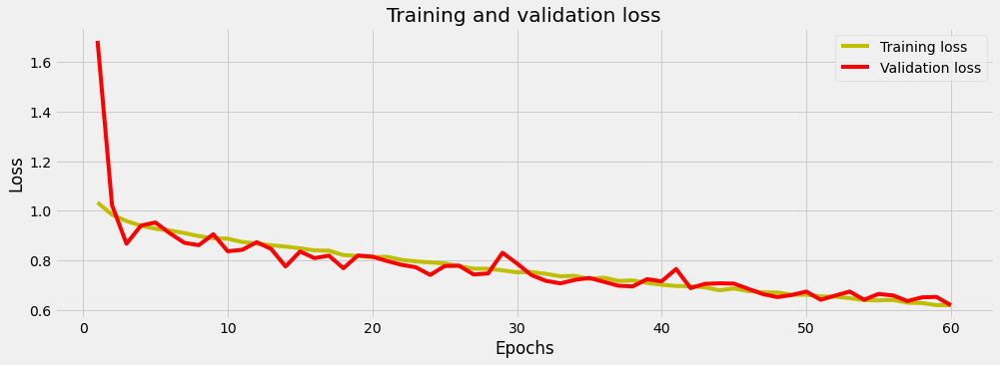

In [36]:
plt.figure(figsize=(15,5))
loss = att_res_unet_history.history['loss']
val_loss = att_res_unet_history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

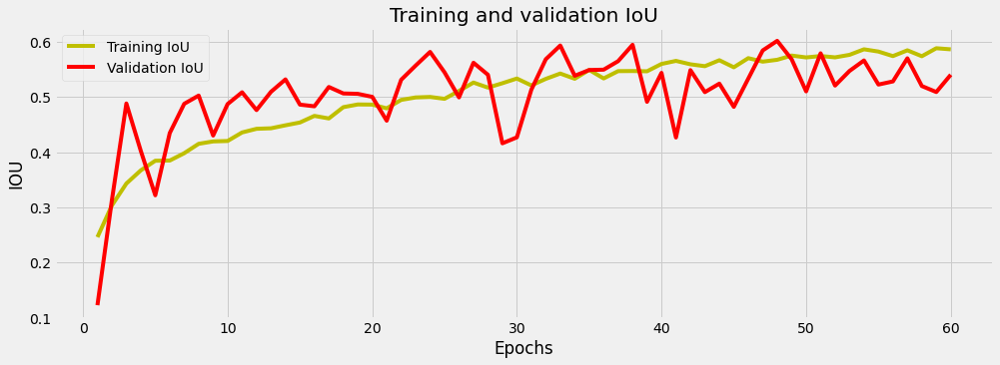

In [37]:
plt.figure(figsize=(15,5))
acc = att_res_unet_history.history['iou_score']
val_acc = att_res_unet_history.history['val_iou_score']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'y', label='Training IoU')
plt.plot(epochs, val_acc, 'r', label='Validation IoU')
plt.title('Training and validation IoU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

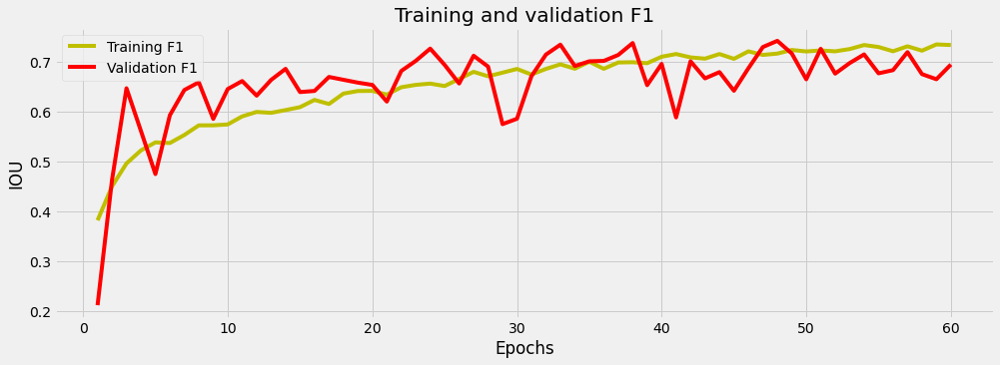

In [38]:
plt.figure(figsize=(15,5))
acc = att_res_unet_history.history['f1-score']
val_acc = att_res_unet_history.history['val_f1-score']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'y', label='Training F1')
plt.plot(epochs, val_acc, 'r', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

# Inference:
<!-- #### Loading another model trained on 100 epoch, you can also replace the the current trained one  -->

In [39]:

model = tf.keras.models.load_model("./attn_res_unet_60_tta_aug_1e4_metrics_change.h5",custom_objects={"bce_dice_loss":bce_dice_loss,"iou_score": sm.metrics.IOUScore(threshold=0.5),"f1-score": sm.metrics.FScore(threshold=0.5)})

In [40]:
def read_image(path):
    x = cv2.imread(path)
    x = cv2.resize(x, (256, 256))
    x = x.astype(np.double)
    return x

def read_mask(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (256, 256))
    x = np.expand_dims(x, axis=-1)
    x = x.astype(np.double)
    return x

# Inference on some validation data:

Text(0.5, 0, 'prediction')

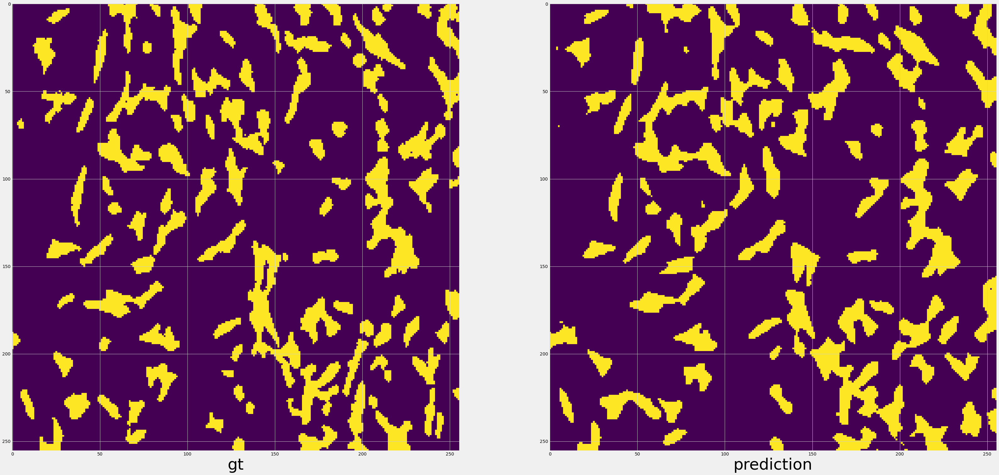

In [41]:

y_data = "../input/sartorious-nb-1-data-preprocessing-visualization"
ids = ['fe3e30f849f4','ffdb3cc02eef','0140b3c8f445','529f53145d75','b89f9cca5384','fe3e30f849f4']
sample_image_df = df[df['id'] == ids[4]]
x = f"../input/sartorius-cell-instance-segmentation/train/{sample_image_df['id'].iloc[0]}.png"
x = read_image(x)
y_file = f"../input/sartorious-nb-1-data-preprocessing-visualization/masks/img/{sample_image_df['id'].iloc[0]}.png"

y = read_mask(y_file)
# print("y shape",y.shape)
y_pred = model.predict(np.expand_dims(x, axis=0))[0]>0.5

h, w, _ = x.shape
white_line = np.ones((h, 10, 3)) * 255.0



           
           
height = 50
width = 50
fig, (ax1,ax2) = plt.subplots(nrows = 1,ncols = 2,figsize=(width,height))
ax = (ax1,ax2)


ax[0].imshow(y)
ax[0].set_xlabel('gt',fontsize=50)
ax[1].imshow(y_pred)
ax[1].set_xlabel('prediction',fontsize=50)



In [42]:
def post_process(probability, threshold=0.5, min_size=300):
    mask = cv2.threshold(probability, threshold, 1, cv2.THRESH_BINARY)[1]
    num_component, component = cv2.connectedComponents(mask.astype(np.uint8))
    predictions = []
    for c in range(1, num_component):
        p = (component == c)
        if p.sum() > min_size:
            a_prediction = np.zeros((520, 704), np.float32)
            a_prediction[p] = 1
            predictions.append(a_prediction)
    return predictions

In [43]:
def rle_encoding(x):
    dots = np.where(x.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return ' '.join(map(str, run_lengths))

# print(rle_encoding(predictions[0]))

In [44]:
sub_file = "../input/sartorius-cell-instance-segmentation/sample_submission.csv"
sub_df = pd.read_csv(sub_file)
sub_df.head()

,id,predicted
0,7ae19de7bc2a,NaN
1,d48ec7815252,NaN
2,d8bfd1dafdc4,NaN


# Basic TTA

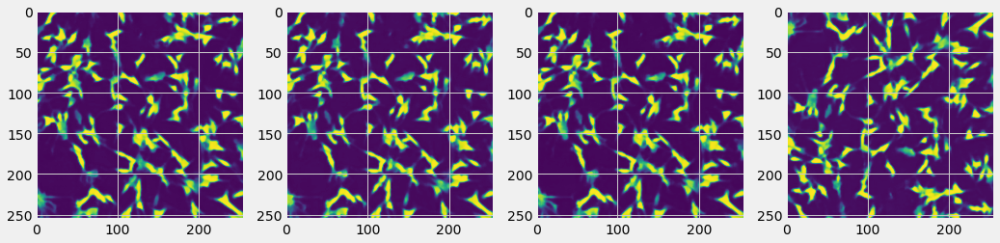

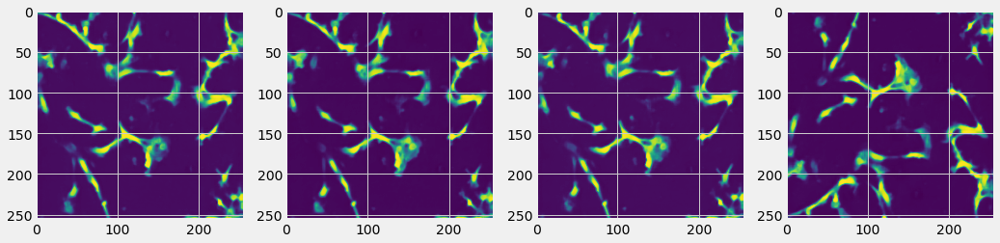

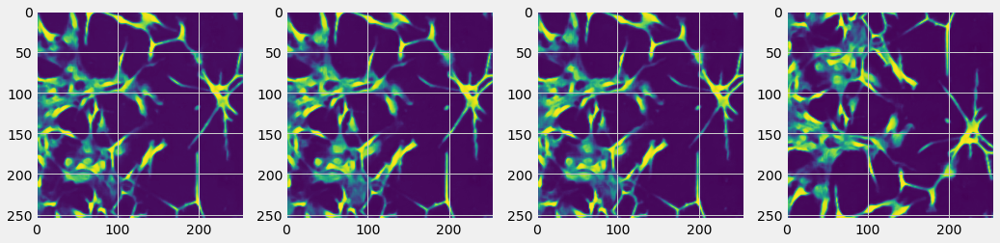

In [45]:
def tta_preds(image_dataset):

    predictions = []
    for image in image_dataset:
        plt.figure(figsize=(20,20))
        pred_original = model.predict(np.expand_dims(image, axis=0))
        plt.subplot(1,5,1)
        plt.imshow(np.reshape(pred_original,(256,256)))
        
        pred_lr = model.predict(np.expand_dims(np.fliplr(image), axis=0))
        pred_lr = np.fliplr(pred_lr.squeeze(0))
        plt.subplot(1,5,2)
        plt.imshow(np.reshape(pred_lr,(256,256)))

        
        pred_ud = model.predict(np.expand_dims(np.flipud(image), axis=0))
        pred_ud = np.flipud(pred_ud.squeeze(0))
        plt.subplot(1,5,3)
        plt.imshow(np.reshape(pred_ud,(256,256)))
        
        
        
        pred_lr_ud = model.predict(np.expand_dims(np.fliplr(np.flipud(image)), axis=0))
        pred_lr_ud = np.fliplr(np.flipud(pred_lr_ud).squeeze(0))
        plt.subplot(1,5,4)
        plt.imshow(np.reshape(pred_lr_ud,(256,256)))

        
        
        preds = (pred_original + pred_lr + pred_ud + pred_lr_ud) / 4
        predictions.append(preds)


    predictions = np.array(predictions)

    threshold = 0.5
    predictions_th = predictions > threshold
    
    return predictions_th

test_dir = "../input/sartorius-cell-instance-segmentation/test"
ids = sub_df["id"].tolist()

sub_list = []
sub_img = []
for i in ids:
    file_path = test_dir + "/" + i + ".png"
    x = read_image(file_path)
    sub_img.append(x)

sub_preds = tta_preds(sub_img)


for ide,j in enumerate(sub_preds):
    y_pred = np.reshape(j.astype(np.uint16),(256,256))
    y_pred = cv2.resize(y_pred,(704,520),interpolation = cv2.INTER_AREA)
    predictions = post_process(y_pred)
    for k in predictions:
        sub_list.append((ids[ide],rle_encoding(k)))

In [46]:
sub = pd.DataFrame(sub_list,columns=['id','predicted'])
sub.head()

,id,predicted
0,7ae19de7bc2a,56 16 760 16 1461 19 2165 19 2867 21 3571 21 4...
1,7ae19de7bc2a,276 11 980 11 1684 16 2388 16 3092 19 3796 19 ...
2,7ae19de7bc2a,488 41 562 27 1192 41 1266 27 1898 44 1970 27 ...
3,7ae19de7bc2a,10523 8 11227 8 11931 10 11950 8 12635 10 1265...
4,7ae19de7bc2a,26522 5 27226 6 27927 11 28631 12 29335 17 300...


In [47]:
sub.to_csv("submission.csv",index=False)

In [48]:
# ref: https://www.kaggle.com/inversion/run-length-decoding-quick-start
def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height, width, channels) of array to return
    color: color for the mask
    Returns numpy array (mask)

    '''
    s = mask_rle.split()

    starts = list(map(lambda x: int(x) - 1, s[0::2]))
    lengths = list(map(int, s[1::2]))
    ends = [x + y for x, y in zip(starts, lengths)]
    if len(shape)==3:
        img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
    else:
        img = np.zeros(shape[0] * shape[1], dtype=np.float32)
    for start, end in zip(starts, ends):
        img[start : end] = color

    return img.reshape(shape)



def build_masks(df_train, image_id, input_shape):
    height, width = input_shape
    labels = df_train[df_train["id"] == image_id]["predicted"].tolist()
    mask = np.zeros((height, width))
    for label in labels:
        mask += rle_decode(label, shape=(height, width))
    mask = mask.clip(0, 1)
    return mask

In [49]:
sub["id"].value_counts()

7ae19de7bc2a    54
d8bfd1dafdc4    25
d48ec7815252    21
Name: id, dtype: int64

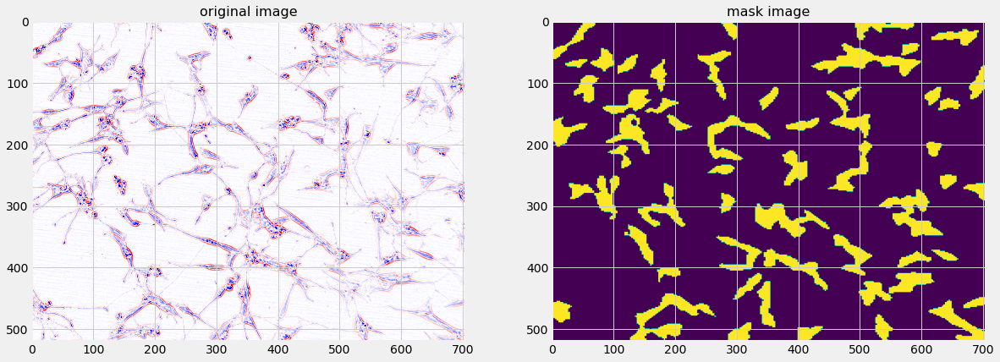

In [50]:
sample_filename = '7ae19de7bc2a'
sample_path = f"../input/sartorius-cell-instance-segmentation/test/{sample_filename}.png"
sample_img = plt.imread(sample_path)

COLOR_MAP = 'seismic'
sample_masks1=build_masks(sub,sample_filename,input_shape=(520, 704))

fig, axs = plt.subplots(1,2, figsize=(18, 18))

axs[0].imshow(sample_img,cmap='seismic')
axs[0].set_title('original image', fontsize=16)


axs[1].imshow(sample_masks1,cmap='gray')
axs[1].set_title('mask image', fontsize=16)

plt.imshow(sample_masks1)

# Checking overlapping:

In [51]:
def remove_overlapping_pixels(mask, other_masks):
    for other_mask in other_masks:
        if np.sum(np.logical_and(mask, other_mask)) > 0:
            mask[np.logical_and(mask, other_mask)] = 0
    return mask

def combine_masks(masks, mask_threshold):
    """
    combine masks into one image
    """
    maskimg = np.zeros((HEIGHT, WIDTH))
    
    for m, mask in enumerate(masks,1):
        maskimg[mask>mask_threshold] = m
    return maskimg


def tta_preds(image_dataset):
#Now that we know the transformations are working, let us extend to all predictions
    predictions = []
    for image in image_dataset:

        pred_original = model.predict(np.expand_dims(image, axis=0))
        
        pred_lr = model.predict(np.expand_dims(np.fliplr(image), axis=0))
        pred_lr = np.fliplr(pred_lr.squeeze(0))

        
        pred_ud = model.predict(np.expand_dims(np.flipud(image), axis=0))
        pred_ud = np.flipud(pred_ud.squeeze(0))

        
        pred_lr_ud = model.predict(np.expand_dims(np.fliplr(np.flipud(image)), axis=0))
        pred_lr_ud = np.fliplr(np.flipud(pred_lr_ud).squeeze(0))

        
        preds = (pred_original + pred_lr + pred_ud + pred_lr_ud) / 4

        predictions.append(preds)


    predictions = np.array(predictions)

    threshold = 0.5
    predictions_th = predictions > threshold
    
    return predictions_th

test_dir = "../input/sartorius-cell-instance-segmentation/test"
ids = sub_df["id"].tolist()

sub_list = []
sub_img = []
for i in ids:
    file_path = test_dir + "/" + i + ".png"
    x = read_image(file_path)
    sub_img.append(x)

sub_preds = tta_preds(sub_img)


for ide,j in enumerate(sub_preds):

    y_pred = np.reshape(j.astype(np.uint16),(256,256))

    y_pred = cv2.resize(y_pred,(704,520),interpolation = cv2.INTER_AREA)

    predictions = post_process(y_pred)

    mask_1 = []

    for i in predictions:
        b_mask = remove_overlapping_pixels(i,mask_1)
        mask_1.append(b_mask)
        sub_list.append((ids[ide],rle_encoding(b_mask)))


        
sub_df_man = pd.DataFrame(sub_list,columns=['id','predicted'])
sub_df_man.head()

,id,predicted
0,7ae19de7bc2a,56 16 760 16 1461 19 2165 19 2867 21 3571 21 4...
1,7ae19de7bc2a,276 11 980 11 1684 16 2388 16 3092 19 3796 19 ...
2,7ae19de7bc2a,488 41 562 27 1192 41 1266 27 1898 44 1970 27 ...
3,7ae19de7bc2a,10523 8 11227 8 11931 10 11950 8 12635 10 1265...
4,7ae19de7bc2a,26522 5 27226 6 27927 11 28631 12 29335 17 300...


## Reference Notebooks
1. https://github.com/MoleImg/Attention_UNet
2. https://www.kaggle.com/aramos/sartorius-competition-training-keras-unet
3. https://www.kaggle.com/ammarnassanalhajali/sartorius-segmentation-keras-u-net-training